# Kaggle November 2022 Project

Dataset Link: ```https://www.kaggle.com/competitions/tabular-playground-series-nov-2022/data```

## Project Summary
Our project was made to explore a creating and optimizing a machine learning pipeline.  We were given a large, ideal dataset composed of prediction values between 0 and 1 over 40,000 unique IDs.  We also had a ground truth table for the first 20,000 IDs.  We created a dataframe with this, but it would be too large and noisy for running any sort of models on.  For EDA, after talking to Prfoessor Tesic and Bishal, we used lasso regression to trim the features down to the 14 most relevant (coefficient > 0) which we used for testing and training.  We created a correlation heatmap as well as a pairwise plot to further understand the data.  We then tried out different algortithms, including logistic regression, gradient-boosting clasifier, XG Boost classifier, K-nearest neighbors, random decision forests and pipelining.  We used K fold cross-validation to validate our datasets for several of the methods.  We evaluated the models based on accuracy, log loss and MSE and created confusion matrices and in logistic regression a precision-recall curve to help visualize the results with different variables used to train the models.  We found XG Boost performed the best closely followed by logistic regresssion.  SVM and K-nnearest neighbors did very poorly comparatively.

## Problem Statement

In this project, we are trying to blend predictions from model predictions in such a way that it gives better results than a single model. We are given submission files containing predictions for a binary classification task. We must blend these files to produce better model predictions as compared to the ground truth labels for the first half of the rows. The benchmark we are using is log loss scores to determine how successful our model is at predicting the testing data binary values. The data for this project comes from the Kaggle Tabular Playground Series for November 2022. The data is in the form of two columns, the first being the unique IDs and the second column being the binary model predictions. Informal success measures we plan to use include accuracy, precision, and recall. 
In the end, we hope to achieve the best improvement in the successful classification of IDs through our submission blending model.

**Importing all libraries for the future use in this notebook file**

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
import glob

from tqdm.auto import tqdm
from sklearn.metrics import roc_auc_score
from sklearn.metrics import log_loss
from sklearn.calibration  import CalibrationDisplay
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Lasso, LogisticRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import precision_recall_curve
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix

## Dataset

The data files are as follows:
 - submission_files/: a folder containing binary model predictions
 - train_labels.csv: the ground truth labels for the first half of the rows in the submission files
 - sample_submission.csv: a sample submission file in the correct format, only containing the row ids for the second half of each file in the submissions folder
 
The data type is csv of size 2.9 GB. The number of data in train and test is 20,000 each. We have 5000 submission files containing unique id numbers for each entry (1-40,000) and a predicted binary value. We also have a set of train labels (1-20,000) with the real "truth values" of wither 0 or 1. 

**First, we are loading the files given into various variables to make it easy to make a single dataframe containing all files.**

In [3]:
# labels contains the labels 1-20000
submission = pd.read_csv('sample_submission.csv', index_col='id')
labels = pd.read_csv('train_labels.csv', index_col='id')

# the ids of the submission rows (useful later)
sub_ids = submission.index

# the ids of the labeled rows (useful later)
gt_ids = labels.index 

# list of files in the submission folder
subs = sorted(os.listdir('submission_files'))
s0 = pd.read_csv('submission_files/' + subs[0], index_col='id')

**A dataframe, called full_df, is made containing all of the 5,000 submission file prediction columns, each a feature to predict the ground truth labels in the train_labels.csv. The dataframe has 40,0000 ID observations. We display the dataframe size, head, information, and statistical description.**

In [4]:
X_train_orig = np.zeros((s0.shape[0], len(subs)))
roc_auc_scores = {}


for i, name in  tqdm(enumerate(subs)):
    sub = pd.read_csv('submission_files/' + name, index_col='id')
    X_train_orig[:,i] = sub.pred.values
    auc_score=roc_auc_score(labels.label[0:20000], X_train_orig[0:20000,i])
    roc_auc_scores[name]=auc_score
full_df = pd.DataFrame(X_train_orig, columns=subs)

0it [00:00, ?it/s]

In [5]:
full_df.shape

(40000, 5000)

In [6]:
full_df.head(10)

,0.6222863195.csv,0.6223807245.csv,0.6225426578.csv,0.6247722291.csv,0.6253455681.csv,0.6254850917.csv,0.6255093621.csv,0.6260141578.csv,0.6263493693.csv,0.6272779211.csv,...,0.7519100517.csv,0.7519556278.csv,0.7520219713.csv,0.7521219579.csv,0.7522329272.csv,0.7523602310.csv,0.7526089604.csv,0.7526999358.csv,0.7551167673.csv,0.7575039918.csv
0,0.709336,0.799007,0.851891,0.537158,0.623930,0.705970,0.503437,0.633185,0.641550,0.666604,...,0.769207,0.750250,0.663370,0.739333,0.822384,0.749498,0.729800,0.867847,0.745888,0.787
1,0.452988,0.364453,0.567582,0.354468,0.513818,0.584119,0.454809,0.238501,0.472171,0.522314,...,0.640052,0.794052,0.721298,0.804369,0.620626,0.733606,0.816942,0.814229,0.598331,0.547
2,0.675462,0.842260,0.800013,0.525229,0.692071,0.715418,0.651008,0.609124,0.691198,0.609994,...,0.812841,0.779859,0.865657,0.828493,0.763010,0.802883,0.806891,0.896058,0.855776,0.667
3,0.481046,0.577118,0.683032,0.541356,0.630088,0.664514,0.413373,0.508210,0.526140,0.584565,...,0.824703,0.799698,0.800130,0.716604,0.603779,0.708499,0.844837,0.853057,0.850657,0.622
4,0.957339,0.910337,0.917322,0.874487,0.787595,0.854273,0.843846,0.876749,0.821128,0.913054,...,0.934803,0.900150,0.960911,0.906037,0.961240,0.935608,0.889757,0.978505,0.953681,0.934
5,0.831414,0.598125,0.276116,0.525463,0.734328,0.520369,0.081827,0.532379,0.821128,0.904294,...,0.908995,0.823174,0.912174,0.930805,0.571190,0.926527,0.889757,0.939157,0.908295,0.935
6,0.716171,0.424948,0.692054,0.328312,0.622229,0.687056,0.502608,0.501735,0.611488,0.580623,...,0.779942,0.716931,0.689678,0.661001,0.856190,0.709248,0.626589,0.575874,0.726107,0.434
7,0.953687,0.934748,0.942298,0.858528,0.794114,0.846232,0.841102,0.951427,0.775044,0.941849,...,0.933843,0.912999,0.930557,0.946958,0.985094,0.970721,0.872210,0.971870,0.933964,0.837
8,0.427233,0.372343,0.814237,0.555591,0.533184,0.609211,0.552825,0.402674,0.509153,0.569622,...,0.587888,0.681688,0.661960,0.608619,0.667168,0.617447,0.659957,0.808672,0.628330,1.000
9,0.619906,0.719119,0.685702,0.640120,0.659804,0.705191,0.497439,0.563905,0.543911,0.529731,...,0.808328,0.776024,0.778681,0.821828,0.814284,0.808427,0.753920,0.816997,0.671402,0.658


In [7]:
full_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Columns: 5000 entries, 0.6222863195.csv to 0.7575039918.csv
dtypes: float64(5000)
memory usage: 1.5 GB


In [8]:
full_df.describe()

,0.6222863195.csv,0.6223807245.csv,0.6225426578.csv,0.6247722291.csv,0.6253455681.csv,0.6254850917.csv,0.6255093621.csv,0.6260141578.csv,0.6263493693.csv,0.6272779211.csv,...,0.7519100517.csv,0.7519556278.csv,0.7520219713.csv,0.7521219579.csv,0.7522329272.csv,0.7523602310.csv,0.7526089604.csv,0.7526999358.csv,0.7551167673.csv,0.7575039918.csv
count,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,...,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000
mean,0.600081,0.603522,0.670462,0.565819,0.604476,0.641897,0.563927,0.594346,0.579904,0.578477,...,0.721407,0.738209,0.737308,0.732551,0.741227,0.730588,0.726427,0.747167,0.720237,0.611637
std,0.210202,0.262275,0.227045,0.254222,0.154668,0.170842,0.236501,0.258357,0.142162,0.210870,...,0.185497,0.102710,0.157321,0.136205,0.214668,0.145921,0.116691,0.196030,0.186214,0.198262
min,0.000000,0.001199,0.009394,0.002033,0.041729,0.020097,0.000485,0.000722,0.172352,0.025838,...,-0.206670,0.142145,0.146543,0.340902,0.014292,0.280990,0.402093,0.002277,-0.236942,0.000000
25%,0.468052,0.405359,0.554399,0.368704,0.528607,0.544847,0.398613,0.396694,0.488855,0.402913,...,0.626483,0.661185,0.625961,0.629501,0.634485,0.623236,0.626589,0.654248,0.620461,0.479000
50%,0.596785,0.623182,0.697256,0.570645,0.627776,0.663795,0.563500,0.607459,0.564790,0.567323,...,0.743651,0.738179,0.754426,0.732832,0.789258,0.734233,0.741504,0.790105,0.742008,0.621000
75%,0.753662,0.830235,0.839524,0.778192,0.719745,0.774548,0.744857,0.815984,0.681045,0.739681,...,0.857235,0.806731,0.862901,0.838427,0.909153,0.844193,0.816492,0.894407,0.854169,0.757000
max,1.000000,0.999679,0.997559,0.999266,0.826321,0.898570,0.989478,0.999938,0.983655,0.999356,...,1.259726,0.987632,0.999971,1.000000,0.997849,0.999983,0.931531,0.996892,1.104878,1.000000


## Exploratory Data Analysis
By concating each of the submission files, each file becomes a feature in the large dataframe, which can potentially help us to predict the ground truth values for the latter 20,000 observations. We displayed a couple histograms to get an idea of the spread of our dataset and submission file predictions. 
Since, 5,000 features is too many features to develop any machine learning models around, we devised a way to reduce the number of features using Lasso regression. Least Absolute Shrinkage and Selection Operator (LASSO) works by shrinking the data values to a central point, where the penalty term forces coefficients to be exactly zero.This technique can produce a model that has high predictive power and is simple to interpret. 
We took the first known 20,000 obserations from the full dataframe and set that as x and y as the ground truth values, performing train test split on the variables. We performed Lasso Regression on the data and eliminated any coumns that contained a Lasso coefficient equal to zero. We were left with 14 non-zero Lasso coefficient features to use in a reduced version of the dataframe. We display a heatmap of the reduced dataframe to display correlations between features. We used this reduced dataframe to train our classification models.

**To get an idea of how many 0 and 1 ground truth values there are in the train_labels.csv, we display a histogram:**

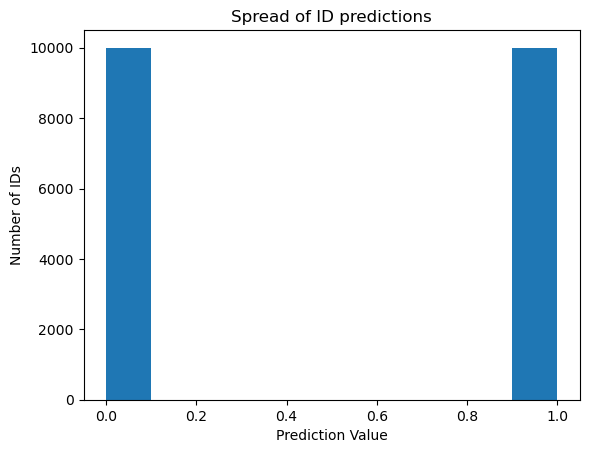

In [9]:
df = pd.read_csv('train_labels.csv')
plt.hist(df['label'],bins=10)
plt.title('Spread of ID predictions')
plt.xlabel('Prediction Value')
plt.ylabel('Number of IDs')
plt.show()

**To get an idea of the spread of a sample file, we display a histogram of the predictions from the first submission file:**

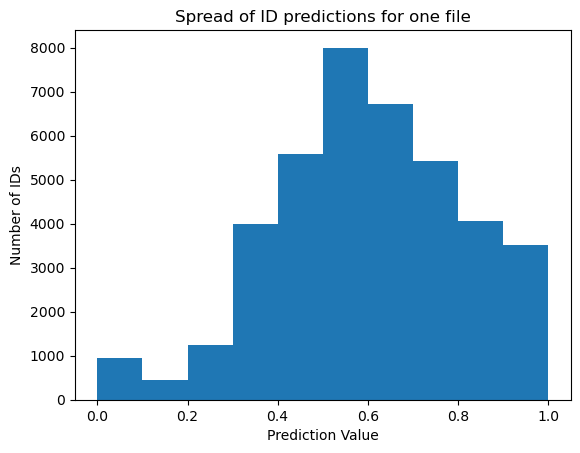

In [10]:
plt.hist(full_df['0.6222863195.csv'],bins=10)
plt.title('Spread of ID predictions for one file')
plt.xlabel('Prediction Value')
plt.ylabel('Number of IDs')
plt.show()

**We split the data into x as the first 20,000 rows of the dataframe and y as the truth values for the first 20,000 IDs. We further split x and y into training and testing data.**

In [11]:
x = full_df[:20000]
df = pd.read_csv('train_labels.csv')
y = df.label.values
x.shape, y.shape

((20000, 5000), (20000,))

In [12]:
xtrain, xtest, ytrain, ytest =  train_test_split(x,y, test_size = 0.2, random_state=1, stratify=y)

**Below is the Lasso Regression process to output lasso coefficients for each feature.**

In [13]:
#Lasso regression
lasso = Lasso(max_iter = 10000)
coefs = []
alphas = 10**np.linspace(10,-2,100)*0.5

for a in alphas:
    lasso.set_params(alpha=a)
    lasso.fit(xtrain, ytrain)
    coefs.append(lasso.coef_)

np.shape(coefs) 

pred_lasso = lasso.predict(xtest)           # Use this model to predict the test data
print(pd.Series(lasso.coef_, index = full_df.columns[0:5000])) # Print coefficients
mse = mean_squared_error(ytest, pred_lasso)          # Calculate the test MSE
print("Test mean squared error (MSE): {:.2f}".format(mse))

print("Lasso Score:", lasso.score(xtest,ytest))

0.6222863195.csv    0.0
0.6223807245.csv    0.0
0.6225426578.csv    0.0
0.6247722291.csv    0.0
0.6253455681.csv    0.0
                   ... 
0.7523602310.csv    0.0
0.7526089604.csv    0.0
0.7526999358.csv    0.0
0.7551167673.csv    0.0
0.7575039918.csv    0.0
Length: 5000, dtype: float64
Test mean squared error (MSE): 0.18
Lasso Score: 0.26351570653081335


**We display a precision recall curve based on the Lasso Regression.**

Text(0, 0.5, 'Recall')

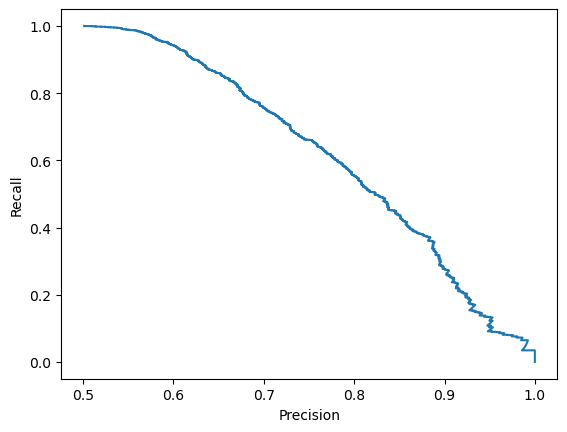

In [14]:
#pass necessary parameters to precision_recall_curve method  
precision, recall, thresholds = precision_recall_curve(ytest,pred_lasso)

plt.plot(precision, recall, label="precision recall curve")
plt.xlabel("Precision")
plt.ylabel("Recall")

In [15]:
np.shape(lasso.coef_)

(5000,)

**We eliminated any features whose lasso coefficients were equal  to zero. We were left with 14 columns without coefficients not equal to zero.**

In [16]:
xtrain.iloc[:,lasso.coef_ != 0]

,0.6255093621.csv,0.6335286032.csv,0.6371788217.csv,0.6454375051.csv,0.6492627054.csv,0.6493925862.csv,0.6526257846.csv,0.6564517315.csv,0.6570599977.csv,0.6601920939.csv,0.6649650861.csv,0.6794230620.csv,0.6863963491.csv,0.7038139555.csv
16786,0.919987,0.947189,0.896726,0.956902,0.968637,0.950587,0.850058,0.934824,0.962189,0.957579,0.944099,0.474706,0.413092,0.754
16308,0.230639,0.268732,0.171071,0.320737,0.383475,0.415070,0.254644,0.335430,0.379143,0.296073,0.179011,0.131164,0.230515,0.026
11582,0.476816,0.217781,0.366211,0.650420,0.603045,0.634788,0.510953,0.650547,0.679411,0.768944,0.723597,0.195516,0.192176,0.130
7622,0.402694,0.584400,0.573052,0.525364,0.533558,0.526512,0.319224,0.580763,0.547548,0.555335,0.441604,0.171226,0.112899,0.186
14457,0.801688,0.893190,0.815466,0.843768,0.874242,0.863253,0.699254,0.925588,0.876921,0.881814,0.942072,0.757091,0.860970,0.604
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3425,0.487367,0.296643,0.433250,0.730494,0.541203,0.641367,0.206397,0.640961,0.530945,0.499927,0.490222,0.233489,0.218196,0.168
11650,0.930273,0.914066,0.954918,0.965504,0.966434,0.985513,0.670025,0.942401,0.966315,0.971579,0.968899,0.770827,0.938483,0.764
11383,0.928281,0.938884,0.950805,0.910486,0.936372,0.945691,0.597521,0.921001,0.946294,0.947113,0.935931,0.673600,0.707745,0.598
13953,0.250053,0.347011,0.290579,0.652082,0.717231,0.728579,0.171963,0.654346,0.649767,0.751380,0.217181,0.150306,0.252249,0.144


**We transfer the leftover features to a dataframe, called reduced_df, with 40,000 rows and now 14 columns. We display the dataframe size, head, information, and statistical description.**

In [17]:
column_names = ["0.6255093621.csv", "0.6335286032.csv", "0.6371788217.csv", "0.6454375051.csv", 
                     "0.6492627054.csv", "0.6493925862.csv", "0.6526257846.csv", "0.6564517315.csv", 
                     "0.6570599977.csv", "0.6601920939.csv", "0.6649650861.csv", "0.6794230620.csv", 
                     "0.6863963491.csv", "0.7038139555.csv"]
reduced_df = full_df[column_names].values

In [18]:
reduced_df.shape

(40000, 14)

In [19]:
reduced_df = pd.DataFrame(reduced_df, columns = column_names)
reduced_df.head()

,0.6255093621.csv,0.6335286032.csv,0.6371788217.csv,0.6454375051.csv,0.6492627054.csv,0.6493925862.csv,0.6526257846.csv,0.6564517315.csv,0.6570599977.csv,0.6601920939.csv,0.6649650861.csv,0.6794230620.csv,0.6863963491.csv,0.7038139555.csv
0,0.503437,0.847155,0.696630,0.922075,0.930759,0.930242,0.537010,0.843527,0.733079,0.755341,0.577148,0.496572,0.521162,0.358
1,0.454809,0.473790,0.417415,0.604563,0.644062,0.629101,0.502368,0.625227,0.644455,0.606747,0.283241,0.142422,0.253618,0.270
2,0.651008,0.644853,0.778724,0.814117,0.810776,0.809876,0.448933,0.816146,0.785100,0.781691,0.119296,0.217391,0.330739,0.430
3,0.413373,0.763677,0.459540,0.817518,0.833290,0.842175,0.550577,0.772266,0.740513,0.744609,0.138014,0.141594,0.222653,0.286
4,0.843846,0.928098,0.945780,0.951825,0.956573,0.964983,0.569731,0.934874,0.974534,0.982246,0.935585,0.718270,0.646274,0.736


In [20]:
reduced_df.describe()

,0.6255093621.csv,0.6335286032.csv,0.6371788217.csv,0.6454375051.csv,0.6492627054.csv,0.6493925862.csv,0.6526257846.csv,0.6564517315.csv,0.6570599977.csv,0.6601920939.csv,0.6649650861.csv,0.6794230620.csv,0.6863963491.csv,0.7038139555.csv
count,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000
mean,0.563927,0.597183,0.625645,0.697570,0.700065,0.698086,0.460589,0.703710,0.700397,0.701037,0.567376,0.360604,0.367160,0.351457
std,0.236501,0.264056,0.265913,0.237896,0.241990,0.240804,0.240823,0.232408,0.228837,0.228044,0.280314,0.219861,0.211832,0.214397
min,0.000485,0.000871,0.001170,0.013339,0.013015,0.003092,0.026941,0.003423,0.001634,0.002603,0.000367,0.043357,0.025078,0.000000
25%,0.398613,0.392289,0.427172,0.588073,0.591186,0.591341,0.258756,0.594134,0.592262,0.593640,0.345724,0.180496,0.202305,0.162000
50%,0.563500,0.614043,0.662837,0.739299,0.743535,0.737820,0.422949,0.748089,0.740276,0.739590,0.586070,0.313968,0.323769,0.318000
75%,0.744857,0.830263,0.858025,0.878449,0.887434,0.882708,0.641128,0.881747,0.874458,0.875198,0.813033,0.493699,0.483396,0.542000
max,0.989478,0.999887,0.999947,0.998227,0.999549,0.999489,0.998915,0.999649,0.999487,0.999594,0.998129,0.974940,1.000000,0.906000


**Below we display a correlation heatmap to show the differing correlations between each of the features.**

<AxesSubplot:>

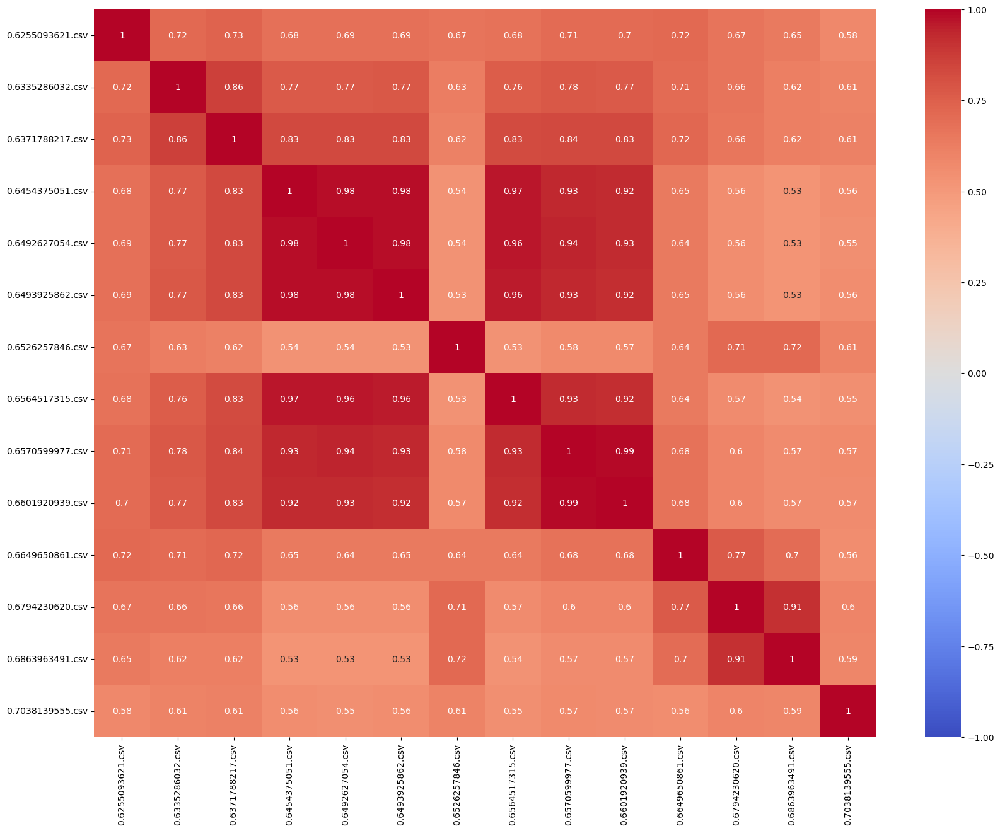

In [21]:
plt.figure(figsize=(20,15))
sns.heatmap(reduced_df.corr(), annot=True, cmap='coolwarm', vmin=-1)

**We also display a pairplot to get an idea of the relationships occurring between each of the features.**

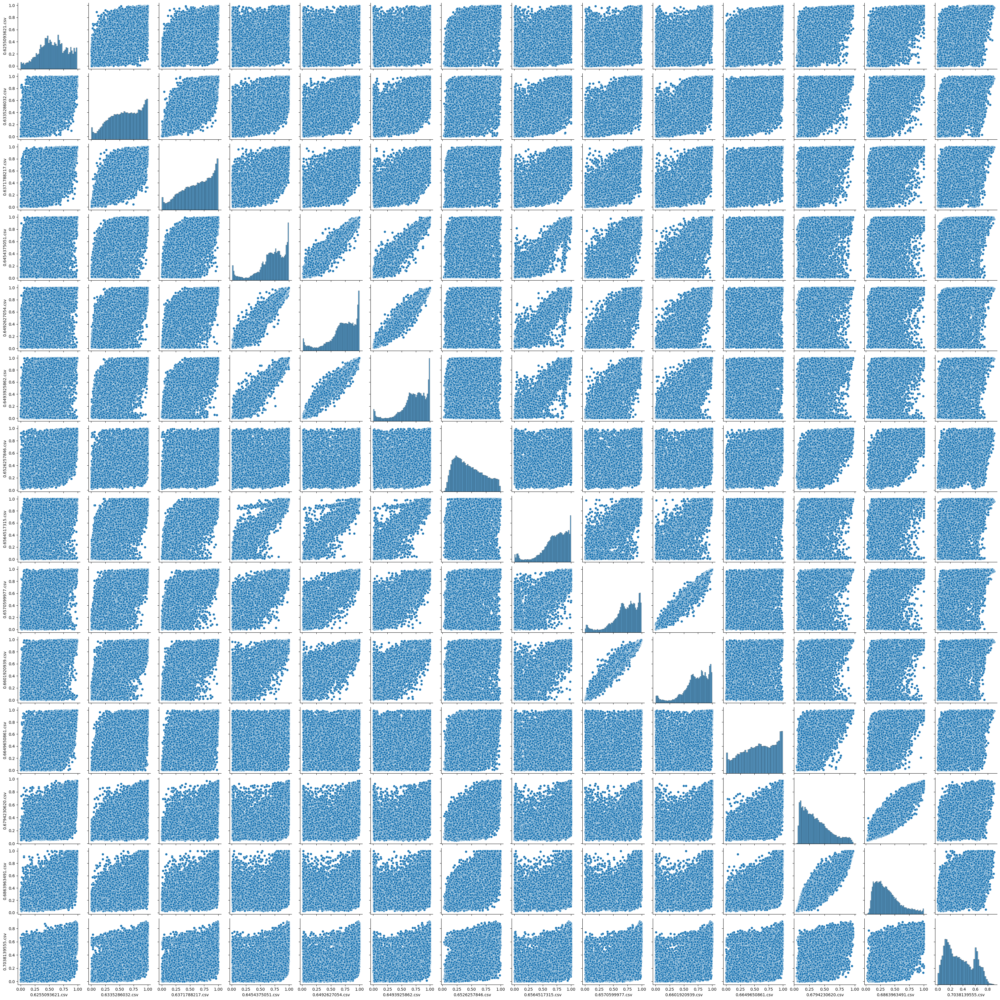

In [22]:
sns.pairplot(reduced_df)

## Data Preprocessing

We considered Principal Component Analysis as a Dimensionality Reduction technique on the full dataset with 5,000 features. PCA minimizes information loss by finding a sequence of linear combinations of the variables that have maximal variance and are 
mutually uncorrelated. PCA will perserve pairwise distances to maximize variance. Displaying the Principal Component Analysis curve showed that all 5,000 columns are needed to fully explain all the data. However, for only a 2% loss in information, we only need less than 200 of the files to explain 98% of the data. Thus, when we later use Pipelining, we will use this graph to decide the number of components.

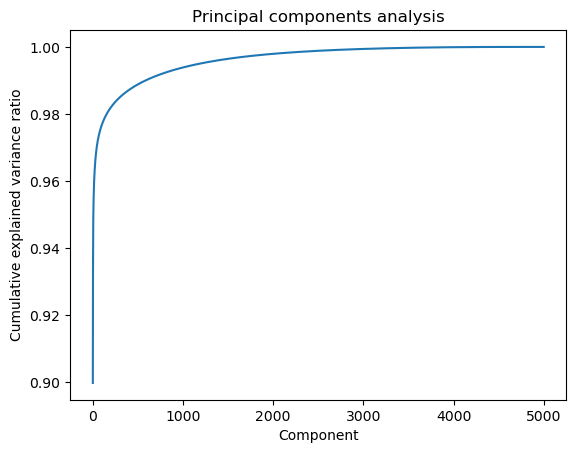

Cumulative explained variance ratio for the first five components: [0.9  0.92 0.93 0.94 0.95]


In [23]:
pca = PCA()
pca.fit_transform(full_df)
plt.plot(pca.explained_variance_ratio_.cumsum())
plt.title('Principal components analysis')
plt.xlabel('Component')
plt.ylabel('Cumulative explained variance ratio')
plt.show()

print('Cumulative explained variance ratio for the first five components:', pca.explained_variance_ratio_.cumsum()[:5].round(2))

## Machine Learning Approaches

Now with a reduction of the 5,000 features we were given to only 14 key features that we deduced from Lasso Regression, we are ready to train and test our model using binary classification models. We wanted to train and test on as many supervised machine learning models as possible to obtain the best results as we compared each model to each other. While we tested the models on different benchmarks, such as accuracy, cross validation scores, precision, and recall, log loss score was ultimately the benchmark we compared models to as this is what would decide a winner in the Kaggle Competition. With our reduced dataframe, we trained and tested on Logistic Regression, Gradient Boosting Classifier, XGBoost Classifier, K Nearest Neighbors, Support Vector Machine, and Random Forest models. Taking the full dataframe into account, based off our Principal Component Analysis curve in the Dimensionaity Reduction section, we create a piplined model that combined PCA and logistic regression. Please see the description under each model below for descriptions of these models, why we chose them, and the specific results of the models.

Our baseline model was Logistic Regression as it seemed to be the obvious, most applicable model to the binary classification problem. From there, we wanted to see how other models performed and if we could improve on the log loss score obtained by Logistic Regression. See Experiments section for a summary of results and performance of each model.

**We split the new reduced matrix with 14 features into train test split**

In [49]:
x = reduced_df[:20000]
y = df.label.values
x.shape, y.shape

((20000, 14), (20000,))

In [50]:
xtrain, xtest, ytrain, ytest =  train_test_split(x,y, test_size = 0.2, random_state=1, stratify=y)

### Logistic Regression

**Logistic Regression is a statistical model that models the probability of an event taking place by having the log-odds for the event be a linear combination of one or more independent variables. It will serve to predict the target binary values for the latter 20,000 IDs from modelling the training data. Using the logistic regression model on our data gave us good results as proven by the log loss score of 0.53483. We output a Confusion Matrix to display the accuracy as well as a precision recall curve.**

In [23]:
# Create a logistic regression model using sklearn library
log_reg = LogisticRegression()
log_reg.fit(xtrain, ytrain)
y_pred_lr = log_reg.predict_proba(xtest)[:,1]

#print score for test data
print("Score:", log_reg.score(xtest,ytest))

# Use sklearn for 5 fold cross validation 
scores_log = cross_val_score(log_reg, xtrain, ytrain, cv=5)

# print the scores from different folds
print("Cross val scores:", scores_log)

logloss = log_loss(ytest, y_pred_lr)
print("Logloss:", logloss)

Score: 0.718
Cross val scores: [0.7290625 0.726875  0.7178125 0.70625   0.7275   ]
Logloss: 0.5348377425240617


C:\Users\elena\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


<Figure size 640x480 with 0 Axes>

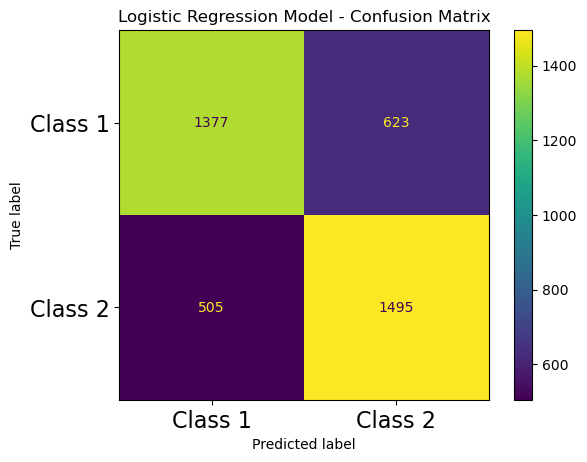

In [24]:
y_pred_lr = (y_pred_lr > 0.5)
cm = confusion_matrix(ytest, y_pred_lr)
plt.figure()
plot_confusion_matrix(log_reg, xtest, ytest)
plt.title("Logistic Regression Model - Confusion Matrix")
plt.xticks(range(2), ["Class 1","Class 2"], fontsize=16)
plt.yticks(range(2), ["Class 1","Class 2"], fontsize=16)
plt.show()

Text(0, 0.5, 'Recall')

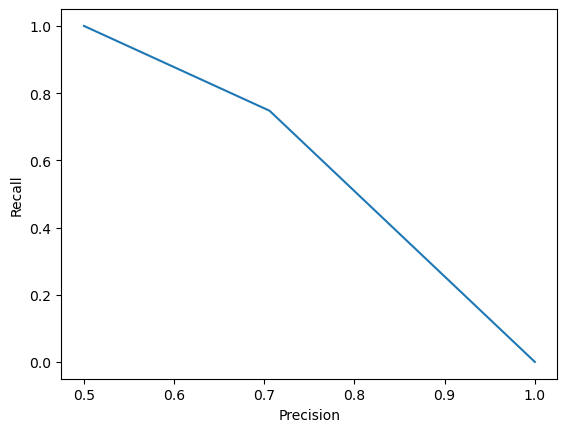

In [25]:
#pass necessary parameters to precision_recall_curve method  
precision, recall, thresholds = precision_recall_curve(ytest,y_pred_lr)

plt.plot(precision, recall, label="LR - precision recall curve")
plt.xlabel("Precision")
plt.ylabel("Recall")

### Gradient Boosting Classifier

**This classifier is both an ensembling method and boosting technique. By combining several predictors with poor accuracy into a strong learner, Gradient Boosting Classifier improves on its predecessor by reducing the errors with each iteration. By varying the learning rates of each gradient boosting model, i.e. learning_rates = [0.05, 0.1, 0.25, 0.5, 0.75, 1], we were able to obtain the best results. With learning_rate = .25, we obtained the best log loss score of  0.52750.**

In [54]:
from sklearn.ensemble import GradientBoostingClassifier
#Gradient Boosting Classifier
learning_rates = [0.05, 0.1, 0.25, 0.5, 0.75, 1]
for learning_rate in learning_rates:
    gb = GradientBoostingClassifier(n_estimators=20, learning_rate = learning_rate, random_state = 123)
    gb.fit(xtrain, ytrain)
    y_pred_gb = gb.predict_proba(xtest)[:,1]
    print("Learning rate: ", learning_rate)
    print("Accuracy score (validation/Test): {0:.3f}".format(gb.score(xtest, ytest)))
    mse = mean_squared_error(ytest, y_pred_gb)   
    print("MSE (validation): {0:.4f}".format(mse))
    logloss = log_loss(ytest, y_pred_gb)
    print("Logloss:", logloss)

Learning rate:  0.05
Accuracy score (validation/Test): 0.721
MSE (validation): 0.1885
Logloss: 0.561158015723946
Learning rate:  0.1
Accuracy score (validation/Test): 0.722
MSE (validation): 0.1801
Logloss: 0.5351451659057922
Learning rate:  0.25
Accuracy score (validation/Test): 0.722
MSE (validation): 0.1785
Logloss: 0.5275088242281208
Learning rate:  0.5
Accuracy score (validation/Test): 0.721
MSE (validation): 0.1809
Logloss: 0.5388941637656643
Learning rate:  0.75
Accuracy score (validation/Test): 0.717
MSE (validation): 0.1841
Logloss: 0.554459601720028
Learning rate:  1
Accuracy score (validation/Test): 0.711
MSE (validation): 0.1868
Logloss: 0.5512949887068239


C:\Users\elena\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


<Figure size 640x480 with 0 Axes>

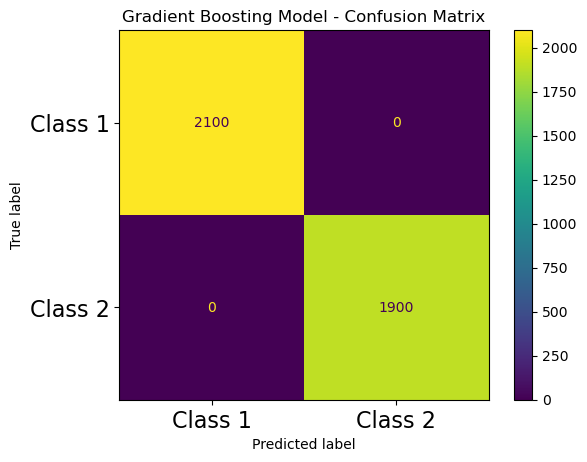

In [56]:
y_pred_gb = (y_pred_gb > 0.5)
cm = confusion_matrix(ytest, y_pred_gb)
plt.figure()
plot_confusion_matrix(gb, xtest, y_pred_gb)
plt.title("Gradient Boosting Model - Confusion Matrix")
plt.xticks(range(2), ["Class 1","Class 2"], fontsize=16)
plt.yticks(range(2), ["Class 1","Class 2"], fontsize=16)
plt.show()

### XG Boost Classifier

**Similar to Gradient Boosting, XGB is an ensembled method, but is comparatively faster than other ensemble classifiers and uses a more regularized model formalization to control over-fitting. XGBoost focuses on the regularization factor to mitigate the trade off between bias and variance. Again, by varying the learning rates of each gradient boosting model, i.e. learning_rates = [0.05, 0.1, 0.25, 0.5, 0.75, 1], we were able to obtain the best results. With learning_rate = 0.05, we got the best log loss score of 0.52636. This ended up being our best classification model.**

In [57]:
from xgboost import XGBClassifier
learning_rates = [0.05, 0.1, 0.25, 0.5, 0.75, 1]
for learning_rate in learning_rates:
    xgb = XGBClassifier(objective="binary:logistic", learning_rate = learning_rate, random_state=42)
    xgb.fit(xtrain, ytrain)

    y_pred_xgb = xgb.predict_proba(xtest)[:,1]
    print("Learning rate: ", learning_rate)
    print("Accuracy score (validation/Test): {0:.3f}".format(xgb.score(xtest, ytest)))
    mse = mean_squared_error(ytest, y_pred_xgb)   
    print("MSE (validation): {0:.4f}".format(mse))

    logloss = log_loss(ytest, y_pred_xgb)
    print("Logloss:", logloss)

Learning rate:  0.05
Accuracy score (validation/Test): 0.721
MSE (validation): 0.1783
Logloss: 0.5263664884620812
Learning rate:  0.1
Accuracy score (validation/Test): 0.718
MSE (validation): 0.1798
Logloss: 0.5305694669749645
Learning rate:  0.25
Accuracy score (validation/Test): 0.715
MSE (validation): 0.1846
Logloss: 0.5457034903419262
Learning rate:  0.5
Accuracy score (validation/Test): 0.696
MSE (validation): 0.2009
Logloss: 0.6031026925851043
Learning rate:  0.75
Accuracy score (validation/Test): 0.686
MSE (validation): 0.2178
Logloss: 0.6915331338525332
Learning rate:  1
Accuracy score (validation/Test): 0.678
MSE (validation): 0.2366
Logloss: 0.8033622183805185


C:\Users\elena\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


<Figure size 640x480 with 0 Axes>

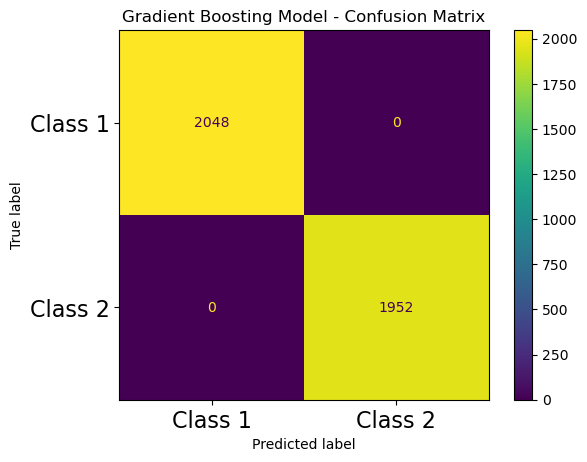

In [58]:
y_pred_xgb = (y_pred_xgb > 0.5)
cm = confusion_matrix(ytest, y_pred_xgb)
plt.figure()
plot_confusion_matrix(xgb, xtest, y_pred_xgb)
plt.title("Gradient Boosting Model - Confusion Matrix")
plt.xticks(range(2), ["Class 1","Class 2"], fontsize=16)
plt.yticks(range(2), ["Class 1","Class 2"], fontsize=16)
plt.show()

### K Nearest Neighbors

**KNN is an algorithm which takes the k closest training examples in the dataset as input and outputs a class membership. The algorithm uses proximity to make classifications or predictions about the grouping of an individual data point. Thus, our algorithm can work to classify testing data based on the predictions of training data from the 14 features. We set up a loop to iterate through differing values of k to obtain the best result, ranging the values between k = 1 to 10. With k = 10, we obtained the best log score for this model, which was 0.92705. This proved to be one of our worse models, which was not surprising as KNN is known to have poorer performance in comparision to other models.**

In [59]:
from sklearn.neighbors import KNeighborsClassifier

# Define KNN model
for k in range(1,11):

    knn = KNeighborsClassifier(n_neighbors=k)

    #Fit KNN model on xtrain, ytrain from above
    knn.fit(xtrain, ytrain)

    #predict y values from xtest
    y_pred_knn = knn.predict_proba(xtest)[:,1]

    #print score for test data
    print("K: ",k,"Train Score: ",knn.score(xtrain,ytrain), "Test Score: ",knn.score(xtest,ytest))
    
    logloss = log_loss(ytest, y_pred_knn)
    print("Logloss:", logloss)

C:\Users\elena\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\elena\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

K:  1 Train Score:  1.0 Test Score:  0.641
Logloss: 12.399558256530927


C:\Users\elena\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\elena\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

K:  2 Train Score:  0.817625 Test Score:  0.6345
Logloss: 6.241933614867779


C:\Users\elena\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\elena\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

K:  3 Train Score:  0.8185625 Test Score:  0.67375
Logloss: 3.630672404043434


C:\Users\elena\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\elena\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

K:  4 Train Score:  0.7829375 Test Score:  0.673
Logloss: 2.3975884154267204


C:\Users\elena\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\elena\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

K:  5 Train Score:  0.7824375 Test Score:  0.6885
Logloss: 1.8627632140361492


C:\Users\elena\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\elena\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

K:  6 Train Score:  0.76325 Test Score:  0.688
Logloss: 1.3800595476628925


C:\Users\elena\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\elena\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

K:  7 Train Score:  0.7638125 Test Score:  0.6975
Logloss: 1.176454144942571


C:\Users\elena\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\elena\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

K:  8 Train Score:  0.7535 Test Score:  0.694
Logloss: 1.0831078418516487


C:\Users\elena\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\elena\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

K:  9 Train Score:  0.7584375 Test Score:  0.7045
Logloss: 0.9930931578789643


C:\Users\elena\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


K:  10 Train Score:  0.7480625 Test Score:  0.70025
Logloss: 0.9270593586568684


C:\Users\elena\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


C:\Users\elena\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
C:\Users\elena\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


<Figure size 640x480 with 0 Axes>

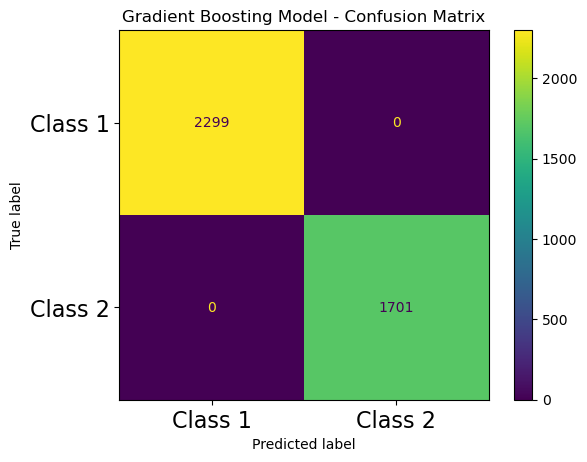

In [60]:
y_pred_knn = (y_pred_knn > 0.5)
cm = confusion_matrix(ytest, y_pred_knn)
plt.figure()
plot_confusion_matrix(knn, xtest, y_pred_knn)
plt.title("Gradient Boosting Model - Confusion Matrix")
plt.xticks(range(2), ["Class 1","Class 2"], fontsize=16)
plt.yticks(range(2), ["Class 1","Class 2"], fontsize=16)
plt.show()

### Support Vector Machine

**A support vector machine (SVM) is a supervised machine learning model that uses classification algorithms for two-group classification problems. SVMs are based on the idea of finding a hyperplane that best divides a dataset into two classes. Because we are looking to predict either 0 or 1 for each observation in the test set, we thought SVMs may be proficient at modeling our dataset. This was our worst model as it achieved a log loss score of  9.66232, but we decided to keep this model here to show the superiority of our other models.**

In [64]:
# import SVC classifier
from sklearn.svm import SVC
# import metrics to compute accuracy
from sklearn.metrics import accuracy_score

svc = SVC(probability = True) 

# fit classifier to training set
svc.fit(xtrain,ytrain)

# make predictions on test set
y_pred_svc = svc.predict_proba(xtest)[:,1]

# compute and print accuracy score
y_pred_svc = (y_pred_svc > 0.5)
print('Model accuracy score with default hyperparameters: {0:0.4f}'. format(accuracy_score(ytest, y_pred_svc)))

mse = mean_squared_error(ytest, y_pred_svc)   
print("MSE (validation): {0:.4f}".format(mse))

logloss = log_loss(ytest, y_pred_svc)
print("Logloss:", logloss)

Model accuracy score with default hyperparameters: 0.7202
MSE (validation): 0.2797
Logloss: 9.662326244343472


C:\Users\elena\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


<Figure size 640x480 with 0 Axes>

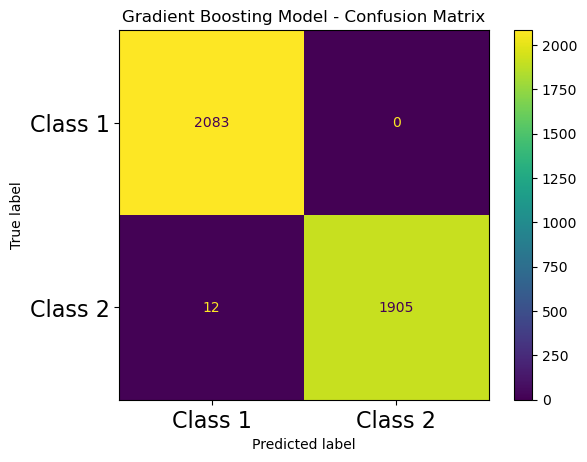

In [65]:
cm = confusion_matrix(ytest, y_pred_svc)
plt.figure()
plot_confusion_matrix(svc, xtest, y_pred_svc)
plt.title("Gradient Boosting Model - Confusion Matrix")
plt.xticks(range(2), ["Class 1","Class 2"], fontsize=16)
plt.yticks(range(2), ["Class 1","Class 2"], fontsize=16)
plt.show()

### Random Forest

**In Random Forest Classifier, we essentially build several decision trees on bootstrapped training samples. However, in contrast to bagging, in each tree and each split, we randomly select a subset of predictors, choose a predictor from this subset for splitting. Thus, we decorrelate the trees, reducing the variance when we average the trees. This model performed on par with the rest of the models as it achieved a log loss score of 0.55891.**

In [51]:
# Create a Random Forest model using sklearn library
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()
rf.fit(xtrain, ytrain)
y_pred_rf = rf.predict_proba(xtest)[:,1]

#print score for test data
print("Score:", rf.score(xtest,ytest))

# Use sklearn for 5 fold cross validation 
scores_log = cross_val_score(rf, xtrain, ytrain, cv=5)

# print the scores from different folds
print("Cross val scores:", scores_log)

logloss = log_loss(ytest, y_pred_rf)
print("Logloss:", logloss)

Score: 0.71625
Cross val scores: [0.72      0.7190625 0.7153125 0.7059375 0.7165625]
Logloss: 0.5589116389012646


### Pipelining

**Pipelining takes a variable number of estimates and returns a pipeline by filling the names automatically. The PCA does an unsupervised dimensionality reduction, while the logistic regression does the prediction. Looking at the full dataframe with 40,000 rows and 5,000 features the PCA curve in the Dimensionality Reduction section showed us we only need less than 200 of the files to explain 98% of the data. Thus, we found that with n_components = 50 gave us the best result in our pipeline. We achieved a log loss score of 0.53494 with this model.**

In [44]:
x = full_df[:20000]
y = df.label.values
x.shape, y.shape

((20000, 5000), (20000,))

In [45]:
xtrain, xtest, ytrain, ytest =  train_test_split(x,y, test_size = 0.2, random_state=1, stratify=y)

In [46]:
model = make_pipeline(PCA(n_components=50), LogisticRegression(C=0.1, solver='saga'))
model.fit(xtrain, ytrain)
y_prediction = model.predict_proba(xtest)[:,1]
print("Accuracy score (validation/Test): {0:.3f}".format(model.score(xtest, ytest)))
mse = mean_squared_error(ytest, y_prediction)   
print("MSE (validation): {0:.4f}".format(mse))
logloss = log_loss(ytest, y_prediction)
print("Logloss:", logloss)

Accuracy score (validation/Test): 0.714
MSE (validation): 0.1812
Logloss: 0.5349410958635668


C:\Users\elena\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


<Figure size 640x480 with 0 Axes>

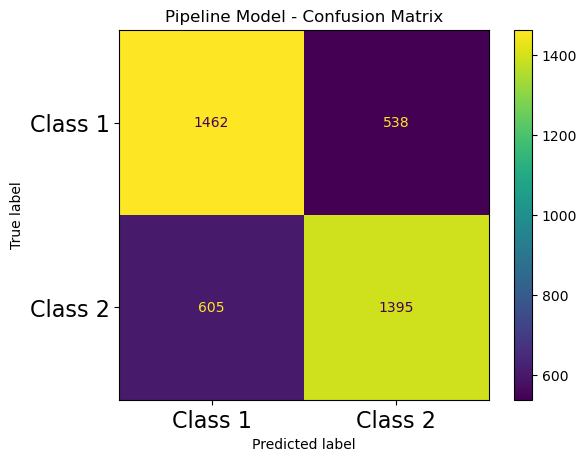

In [47]:
y_prediction = (y_prediction > 0.5)
cm = confusion_matrix(ytest, y_prediction)
plt.figure()
plot_confusion_matrix(model, xtest, ytest)
plt.title("Pipeline Model - Confusion Matrix")
plt.xticks(range(2), ["Class 1","Class 2"], fontsize=16)
plt.yticks(range(2), ["Class 1","Class 2"], fontsize=16)
plt.show()

## Experiments

To evaluate our models, we chose a couple metrics and compared each model's score in that metric in order to determine the most accurate model. We mainly utilized log loss score and accuracy, along with with mean sqaured error, precision, and recall, to evaluate all of our models. Log loss score and accuracy represent how close the prediction probability is to the ground truth values, so we decided they would be the ideal metrics in order to evaluate the relative success of each model. We compared each model to our baseline model of Logistic Regression, as this logically seemed to fit our binary classification data the best. The log loss score for the baseline model was 0.53483. Both XGBoost Classifier and Gradient Boosting Classifier outperformed the baseline model with log loss scores of 0.52636 and 0.52750, respectively. 

## Conclusion
**Complete for the Project Submission**

What did not work?
What do you think why?
What were approaches, tuning model parameters you have tried?
What features worked well and what didn't?
When describing methods that didn't work, make clear how they failed and any evaluation metrics you used to decide so.
How was that a data-driven decision? Be consise, all details can be left in .ipynb